In [1]:
linkWorldMap="https://github.com/CienciaDeDatosEspacial/intro_geodataframe/raw/main/maps/worldMaps.gpkg"


import geopandas as gpd
from  fiona import listlayers
listlayers(linkWorldMap)

['countries', 'rivers', 'cities', 'indicators']

In [2]:
countries=gpd.read_file(linkWorldMap,layer='countries')
rivers=gpd.read_file(linkWorldMap,layer='rivers')
cities=gpd.read_file(linkWorldMap,layer='cities')
indicators=gpd.read_file(linkWorldMap,layer='indicators')

# Exercise 1
<div class="alert-success">

1. Follow the same steps in this last section to plot three maps of one country. Do not use Brazil.
2. Plot your three layers.
    
</div>

In [3]:
#we keep or country (India)
india=countries[countries.COUNTRY=='India']
india

,COUNTRY,geometry
104,India,"MULTIPOLYGON (((92.26860 23.71944, 92.20305 23..."


In [4]:
citiesIndia_clipped = gpd.clip(gdf=cities,
                          mask=india)
riversIndia_clipped = gpd.clip(gdf=rivers,
                               mask=india)

<Axes: >

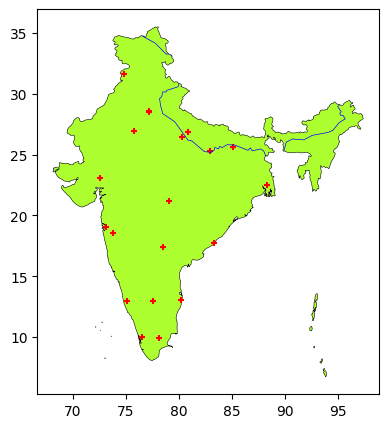

In [5]:
base = india.plot(facecolor="greenyellow", edgecolor='black', linewidth=0.4,figsize=(5,5))
citiesIndia_clipped.plot(marker='+', color='red', markersize=15,
                    ax=base)
riversIndia_clipped.plot(edgecolor='blue', linewidth=0.5,
                    ax=base)

# Exercise 2
<div class="alert-success">

1. Reproject your country's map layers.
2. Plot the reprojected layers
3. Save the reprojected layers
    
</div>

In [6]:
india.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
#revisar si ya está proyectado
india.crs.is_projected

False

In [8]:
#reproyectando
india.to_crs(24378).crs.axis_info

[Axis(name=Easting, abbrev=E, direction=east, unit_auth_code=EPSG, unit_code=9001, unit_name=metre),
 Axis(name=Northing, abbrev=N, direction=north, unit_auth_code=EPSG, unit_code=9001, unit_name=metre)]

In [9]:
#obteniendo el centroide del país
india.to_crs(24378).centroid

104    POINT (3941793.374 -124769.745)
dtype: geometry

<Axes: >

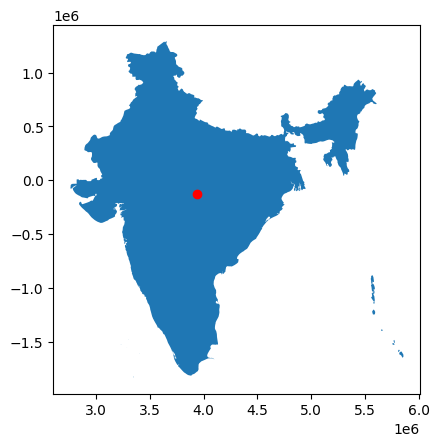

In [10]:
# replotting:
base24378=india.to_crs(24378).plot()
india.to_crs(24378).centroid.plot(color='red',ax=base24378)

In [11]:
#guardando la nueva versión de los mapas
india_24378=india.to_crs(24378)
cities_india_24378=citiesIndia_clipped.to_crs(india_24378.crs)
rivers_india_24378=riversIndia_clipped.to_crs(india_24378.crs)

<Axes: >

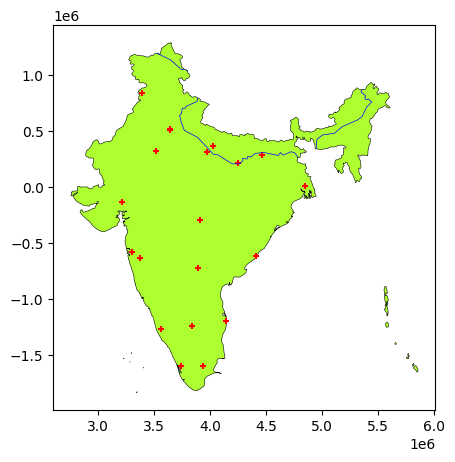

In [12]:
#graficando los nuevos mapas
base = india_24378.plot(facecolor="greenyellow", edgecolor='black', linewidth=0.4,figsize=(5,5))
cities_india_24378.plot(marker='+', color='red', markersize=15,
                    ax=base)
rivers_india_24378.plot(edgecolor='blue', linewidth=0.5,
                    ax=base)


In [13]:
#guardamos los resultados
import os

india_24378.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='country', driver="GPKG")
cities_india_24378.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='cities', driver="GPKG")
rivers_india_24378.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='rivers', driver="GPKG")
india_24378.centroid.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='centroid', driver="GPKG")

# Exercise 3
<div class="alert-success">

1. Find the airports for your country [here](https://ourairports.com/data/). The data is in a CSV file.
2. Create projected layer of airports.
3. Plot all the layers and airports on top.
    
</div>

In [14]:
import pandas as pd
infoairports=pd.read_csv("https://github.com/in-Sinergy/IndiaData/raw/main/in-airports.csv")
infoairports.head()

,id,ident,type,name,latitude_deg,longitude_deg,elevation_ft,continent,country_name,iso_country,...,municipality,scheduled_service,gps_code,iata_code,local_code,home_link,wikipedia_link,keywords,score,last_updated
0,26555,VIDP,large_airport,Indira Gandhi International Airport,28.555630,77.095190,777.0,AS,India,IN,...,New Delhi,1,VIDP,DEL,NaN,http://www.newdelhiairport.in/,https://en.wikipedia.org/wiki/Indira_Gandhi_In...,Palam Air Force Station,51475,2022-02-11T17:31:57+00:00
1,26434,VABB,large_airport,Chhatrapati Shivaji International Airport,19.088699,72.867897,39.0,AS,India,IN,...,Mumbai,1,VABB,BOM,NaN,http://www.csia.in/,https://en.wikipedia.org/wiki/Chhatrapati_Shiv...,"Bombay, Sahar International Airport",1014475,2013-04-12T01:27:48+00:00
2,26618,VOMM,large_airport,Chennai International Airport,12.990005,80.169296,52.0,AS,India,IN,...,Chennai,1,VOMM,MAA,NaN,NaN,https://en.wikipedia.org/wiki/Chennai_Internat...,Madras,51150,2022-09-09T12:28:58+00:00
3,35145,VOBL,large_airport,Kempegowda International Airport,13.197900,77.706299,3000.0,AS,India,IN,...,Bangalore,1,VOBL,BLR,NaN,http://www.bengaluruairport.com/home/home.jspx,https://en.wikipedia.org/wiki/Kempegowda_Inter...,NaN,51200,2016-02-01T17:54:36+00:00
4,26496,VECC,large_airport,Netaji Subhash Chandra Bose International Airport,22.654699,88.446701,16.0,AS,India,IN,...,Kolkata,1,VECC,CCU,NaN,https://www.nscbiairport.com/,https://en.wikipedia.org/wiki/Netaji_Subhash_C...,"Calcutta, Kolkatta, Dum Dum Air Force Station",1200,2024-04-30T10:42:24+00:00


In [15]:
#we don't need all the columns, so:
infoairports.columns

Index(['id', 'ident', 'type', 'name', 'latitude_deg', 'longitude_deg',
       'elevation_ft', 'continent', 'country_name', 'iso_country',
       'region_name', 'iso_region', 'local_region', 'municipality',
       'scheduled_service', 'gps_code', 'iata_code', 'local_code', 'home_link',
       'wikipedia_link', 'keywords', 'score', 'last_updated'],
      dtype='object')

In [16]:
keep=['name','type','latitude_deg', 'longitude_deg','elevation_ft','region_name','municipality']
infoairports=infoairports.loc[:,keep]

infoairports.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 627 entries, 0 to 626
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           627 non-null    object 
 1   type           627 non-null    object 
 2   latitude_deg   627 non-null    float64
 3   longitude_deg  627 non-null    float64
 4   elevation_ft   381 non-null    float64
 5   region_name    627 non-null    object 
 6   municipality   557 non-null    object 
dtypes: float64(3), object(4)
memory usage: 34.4+ KB


<Axes: xlabel='longitude_deg', ylabel='latitude_deg'>

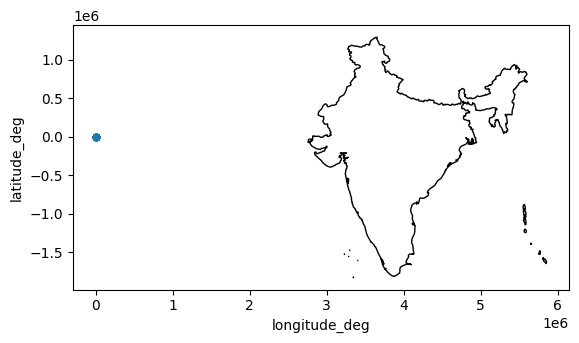

In [17]:
#surprisingly, the data is already clean
#so let's plot it
base = india_24378.plot(color='white', edgecolor='black')

infoairports.plot.scatter(x = 'longitude_deg', y = 'latitude_deg',ax=base)

In [18]:
#coordinates were in degrees, let's change that
airports=gpd.GeoDataFrame(data=infoairports.copy(),
                 geometry=gpd.points_from_xy(infoairports.longitude_deg,
                                             infoairports.latitude_deg),
                 crs=india.crs.to_epsg())

<Axes: >

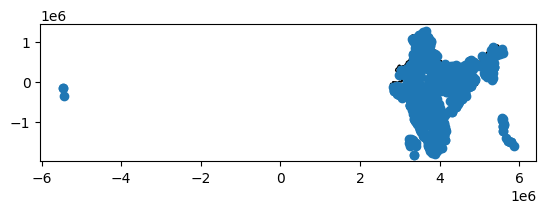

In [19]:
#reprojecting
airports_24378=airports.to_crs(24378)
base = india_24378.plot(color='white', edgecolor='black')
airports_24378.plot(ax=base)

In [20]:
#checking what type of airports do we have
airports_24378['type'].value_counts()

type
heliport          278
small_airport     183
medium_airport    121
closed             32
large_airport      12
seaplane_base       1
Name: count, dtype: int64

In [21]:
airports_24378.rename(columns={'type':'kind'},inplace=True)

## adding the airports to GPKG
airports_24378.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='airports', driver="GPKG")

<Axes: >

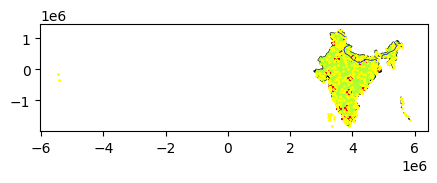

In [22]:
#plotting everything together
base = india_24378.plot(facecolor="greenyellow", edgecolor='black', linewidth=0.4,figsize=(5,5))
cities_india_24378.plot(marker='+', color='red', markersize=15,
                    ax=base)
rivers_india_24378.plot(edgecolor='blue', linewidth=0.5,
                    ax=base)
airports_24378.plot(marker='x', color='yellow', markersize=1,ax=base)

# Exercise 4

<div class="alert-success">
    
1. Check if your country is a polygon or multipolygon.
    
2. Recover just the boundaries of that country.
    
3. Turn the boundary into a GDF.
</div>

In [30]:
#checking what type of gdf we have
india_24378

,COUNTRY,geometry
104,India,"MULTIPOLYGON (((5221622.518 222074.606, 521536..."


<Axes: >

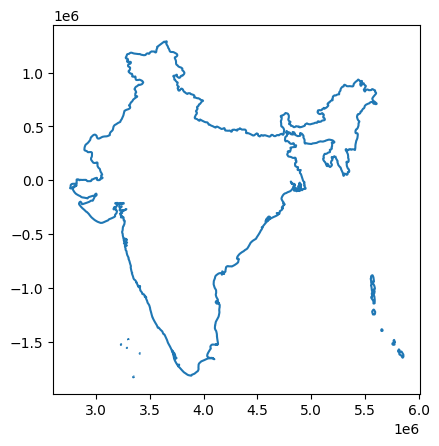

In [31]:
#extracting only the borders
india_24378.boundary.plot()

In [32]:
#this, however, does not return a GDF
type(india_24378.boundary)

geopandas.geoseries.GeoSeries

In [33]:
#creating GDF
india_24378.boundary.to_frame()

,0
104,"MULTILINESTRING ((5221622.518 222074.606, 5215..."


In [34]:
#adding relevant info
# conversion
india_border=india_24378.boundary.to_frame()

# new column (optional)
india_border['name']='India'

# renaming the geometry column
india_border.rename(columns={0:'geometry'},inplace=True)

#setting the geometry (the name is not enough)
india_border = india_border.set_geometry("geometry")

# verifying:
india_border.crs

<Projected CRS: EPSG:24378>
Name: Kalianpur 1975 / India zone I
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: India - north of 28°N.
- bounds: (70.35, 28.0, 81.64, 35.51)
Coordinate Operation:
- name: India zone I (1975 metres)
- method: Lambert Conic Conformal (1SP)
Datum: Kalianpur 1975
- Ellipsoid: Everest 1830 (1975 Definition)
- Prime Meridian: Greenwich

In [35]:
india_border

,geometry,name
104,"MULTILINESTRING ((5221622.518 222074.606, 5215...",India


In [36]:
#saving to file
india_border.to_file(os.path.join("maps","indiaMaps_24378.gpkg"), layer='border', driver="GPKG")

# Exercise 5 (conditional)

<div class="alert-success">

1. Look for sub administrative divisions of your country
2. Check all the CRSs of those divisions
3. If you find one CRS is missing, fill the CRS with the right projection.
</div>

In [37]:
#reading data about states and municipalities
india_states=gpd.read_file("https://github.com/in-Sinergy/IndiaData/raw/main/geoBoundaries-IND-ADM1-all/geoBoundaries-IND-ADM1.shp")
india_municipalities=gpd.read_file("https://github.com/in-Sinergy/IndiaData/raw/main/geoBoundaries-IND-ADM2-all/geoBoundaries-IND-ADM2.shp")

In [38]:
#checking what type of data we have downloaded from the web
type(india_states), type(india_municipalities)

(geopandas.geodataframe.GeoDataFrame, geopandas.geodataframe.GeoDataFrame)

In [39]:
india_states.geometry.head()

0    MULTIPOLYGON (((75.53056 11.70403, 75.53227 11...
1    MULTIPOLYGON (((80.27289 18.72299, 80.27229 18...
2    POLYGON ((95.23392 26.68246, 95.23355 26.68174...
3    MULTIPOLYGON (((73.01113 8.27759, 73.01124 8.2...
4    MULTIPOLYGON (((79.39526 25.03209, 79.39496 25...
Name: geometry, dtype: geometry

In [40]:
india_municipalities.geometry.head()

0    POLYGON ((78.17491 24.84254, 78.17675 24.84188...
1    POLYGON ((77.38167 23.07004, 77.38262 23.07056...
2    POLYGON ((79.23988 22.79135, 79.24004 22.79002...
3    POLYGON ((78.27229 22.39973, 78.27269 22.39938...
4    POLYGON ((78.03027 22.79953, 78.03227 22.79883...
Name: geometry, dtype: geometry

In [41]:
#checking if they have CRSs
india_states.crs, india_municipalities.crs
#they do!

(<Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich,
 <Geographic 2D CRS: EPSG:4326>
 Name: WGS 84
 Axis Info [ellipsoidal]:
 - Lat[north]: Geodetic latitude (degree)
 - Lon[east]: Geodetic longitude (degree)
 Area of Use:
 - name: World.
 - bounds: (-180.0, -90.0, 180.0, 90.0)
 Datum: World Geodetic System 1984 ensemble
 - Ellipsoid: WGS 84
 - Prime Meridian: Greenwich)

In [42]:
#chaging the CRS to reproject
india_states=india_states.to_crs(24378)
india_municipalities=india_municipalities.to_crs(24378)

# Exercise 6


<div class="alert-success">

1. Create some subset of polygons with your country data.
2. Use Unary UNION with those  polygons.
3. Create a geoDF with the result.
4. Use dissolve with the same polygons, and create a geoDF.
    
</div>

<Axes: >

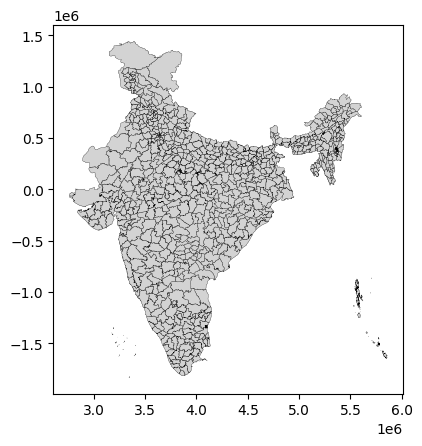

In [43]:
india_municipalities.plot(facecolor='lightgrey', edgecolor='black',linewidth=0.2)

In [44]:
india_states.head()

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Puducherry,IN-PY,1811400B81659894240990,IND,ADM1,"MULTIPOLYGON (((3615218.803 -1404034.875, 3615..."
1,MahÄrÄshtra,IN-MH,1811400B15614733245507,IND,ADM1,"MULTIPOLYGON (((4069329.148 -547888.695, 40692..."
2,NÄgÄland,IN-NL,1811400B74762431478096,IND,ADM1,"POLYGON ((5434725.700 614866.440, 5434710.250 ..."
3,Lakshadweep,IN-LD,1811400B55669546485086,IND,ADM1,"MULTIPOLYGON (((3342874.367 -1827978.304, 3342..."
4,Uttar Pradesh,IN-UP,1811400B11231190780494,IND,ADM1,"MULTIPOLYGON (((3899169.719 147286.646, 389913..."


In [45]:
india_municipalities.head()

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Ashoknagar,None,76128533B75548370501185,IND,ADM2,"POLYGON ((3777786.732 113710.355, 3777980.275 ..."
1,Raisen,None,76128533B57893545331548,IND,ADM2,"POLYGON ((3714762.822 -91130.957, 3714855.830 ..."
2,Chhindwara,None,76128533B70646408240587,IND,ADM2,"POLYGON ((3909832.785 -103599.062, 3909865.233..."
3,Betul,None,76128533B82559220423608,IND,ADM2,"POLYGON ((3813954.559 -157471.574, 3813999.905..."
4,Hoshangabad,None,76128533B45314020251888,IND,ADM2,"POLYGON ((3784588.659 -115209.995, 3784803.071..."


In [46]:
#as we can see, they're sepparated, so we have to clip them in order to subset them
statesCopy = india_states.copy()
statesCopy.head()

,shapeName,shapeISO,shapeID,shapeGroup,shapeType,geometry
0,Puducherry,IN-PY,1811400B81659894240990,IND,ADM1,"MULTIPOLYGON (((3615218.803 -1404034.875, 3615..."
1,MahÄrÄshtra,IN-MH,1811400B15614733245507,IND,ADM1,"MULTIPOLYGON (((4069329.148 -547888.695, 40692..."
2,NÄgÄland,IN-NL,1811400B74762431478096,IND,ADM1,"POLYGON ((5434725.700 614866.440, 5434710.250 ..."
3,Lakshadweep,IN-LD,1811400B55669546485086,IND,ADM1,"MULTIPOLYGON (((3342874.367 -1827978.304, 3342..."
4,Uttar Pradesh,IN-UP,1811400B11231190780494,IND,ADM1,"MULTIPOLYGON (((3899169.719 147286.646, 389913..."


In [47]:
rename = {'shapeName': 'ADM1', 'shapeType': 'level'}
statesCopy = statesCopy.rename(columns=rename)
statesCopy.head()

,ADM1,shapeISO,shapeID,shapeGroup,level,geometry
0,Puducherry,IN-PY,1811400B81659894240990,IND,ADM1,"MULTIPOLYGON (((3615218.803 -1404034.875, 3615..."
1,MahÄrÄshtra,IN-MH,1811400B15614733245507,IND,ADM1,"MULTIPOLYGON (((4069329.148 -547888.695, 40692..."
2,NÄgÄland,IN-NL,1811400B74762431478096,IND,ADM1,"POLYGON ((5434725.700 614866.440, 5434710.250 ..."
3,Lakshadweep,IN-LD,1811400B55669546485086,IND,ADM1,"MULTIPOLYGON (((3342874.367 -1827978.304, 3342..."
4,Uttar Pradesh,IN-UP,1811400B11231190780494,IND,ADM1,"MULTIPOLYGON (((3899169.719 147286.646, 389913..."


In [48]:
#for example, let's work with the municipalities in Uttar Pradesh (state)
UttarPradesh= statesCopy[statesCopy.ADM1=='Uttar Pradesh']
UttarPradesh

,ADM1,shapeISO,shapeID,shapeGroup,level,geometry
4,Uttar Pradesh,IN-UP,1811400B11231190780494,IND,ADM1,"MULTIPOLYGON (((3899169.719 147286.646, 389913..."


<Axes: >

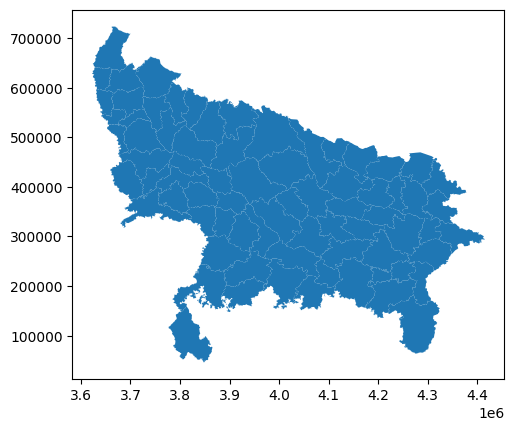

In [49]:
muni1_clipped = gpd.clip(gdf=india_municipalities,
                          mask=UttarPradesh)
muni1_clipped.plot()

In [50]:
#combining the polygons with Unary UNION
muni1_clipped.unary_union

In [51]:
#saving it
UttarPradesh_union = muni1_clipped.unary_union

In [52]:
#however, we have a multipolygon, but we want a GDF
type(UttarPradesh_union)

shapely.geometry.multipolygon.MultiPolygon

In [53]:
#creating the GDF
gpd.GeoDataFrame(index=[0],data={'ADM':'Uttar Pradesh'},
                 crs=muni1_clipped.crs,
                 geometry=[UttarPradesh_union])

,ADM,geometry
0,Uttar Pradesh,"MULTIPOLYGON (((3652752.534 518081.402, 365273..."


<Axes: >

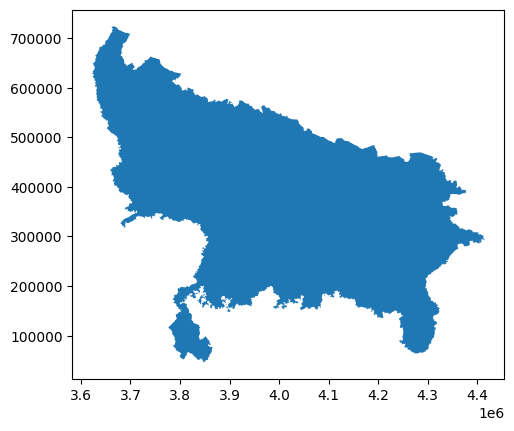

In [54]:
#going back and using dissolve
muni1_clipped.dissolve().plot()

In [55]:
#saving and checking what type of data we have
UttarPradesh_dissolve = muni1_clipped.dissolve()
type(UttarPradesh_dissolve)
#it is already a GDF!

geopandas.geodataframe.GeoDataFrame

# Exercise 7

<div class="alert-success">

1. Select some points from your maps.
    
2. Create the convex hull for those points.
    
3. Turn the hull into a GDF.
    
4. Plot the hull on top of the country.
    
</div>

In [56]:
#extracting the data from the centroid
india_24378.centroid.x.values[0],india_24378.centroid.y.values[0]

(3941793.3735035975, -124769.74489606521)

In [57]:
# saving the coordinates
centroidX,centroidY=india_24378.centroid.x.values[0],india_24378.centroid.y.values[0]

# subsets of medium airports
India_AirTopLeft=airports_24378[airports_24378.kind=='medium_airport'].cx[:centroidX,centroidY:]
India_AirTopRight=airports_24378[airports_24378.kind=='medium_airport'].cx[centroidX:,centroidY:]
India_AirBottomLeft=airports_24378[airports_24378.kind=='medium_airport'].cx[:centroidX,:centroidY]
India_AirBottomRight=airports_24378[airports_24378.kind=='medium_airport'].cx[centroidX:,:centroidY]

<Axes: >

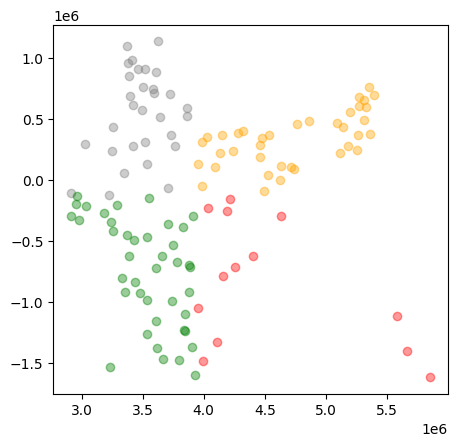

In [58]:
#plotting those subsets
base=India_AirTopLeft.plot(facecolor='grey', alpha=0.4)
India_AirTopRight.plot(ax=base,facecolor='orange', alpha=0.4)
India_AirBottomLeft.plot(ax=base,facecolor='green', alpha=0.4)
India_AirBottomRight.plot(ax=base,facecolor='red', alpha=0.4)

<Axes: >

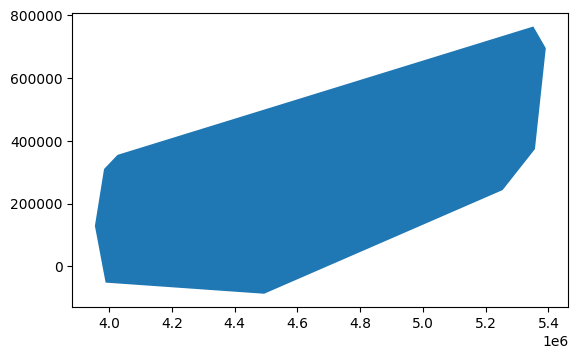

In [59]:
#let's create a convex hull for the top right subset
India_AirTopRight.dissolve().convex_hull.plot()
#which results in a polygon

In [60]:
#turning this into a GDF
TopRAirport_hull= gpd.GeoDataFrame(index=[0],
                                    crs=India_AirTopRight.crs,
                                    geometry=[India_AirTopRight.unary_union.convex_hull])
TopRAirport_hull['name']='top right airport hull'

# then

TopRAirport_hull

,geometry,name
0,"POLYGON ((4493942.880 -86835.495, 3988893.929 ...",top right airport hull


<Axes: >

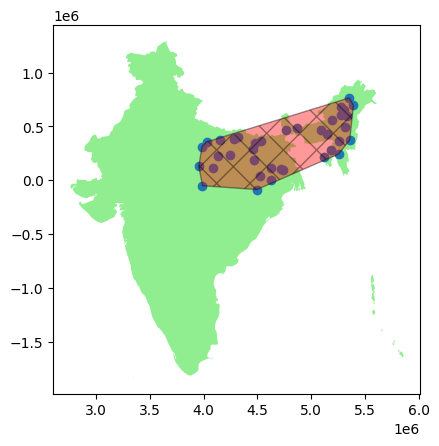

In [61]:
#plotting both the hull and the country map
base=india_24378.plot(facecolor='lightgreen')
India_AirTopRight.plot(ax=base)
TopRAirport_hull.plot(ax=base,facecolor='red',
                       edgecolor='black',alpha=0.4,
                       hatch='X')

# Exercise 8

<div class="alert-success">

1. Apply two of these operations to your maps.
2. Apply two of these operations to the  next maps:
        
</div>

###**1. APPLYING TO OUR MAPS**

In [62]:
#creating GDFs for different zones of the country
# the north
MunisN_india=india_municipalities.cx[:,centroidY:]
# the south
MunisS_india=india_municipalities.cx[:,:centroidY]
# the west
MunisW_india=india_municipalities.cx[:centroidX,:]
# the east
MunisE_india=india_municipalities.cx[centroidX:,:]

<Axes: >

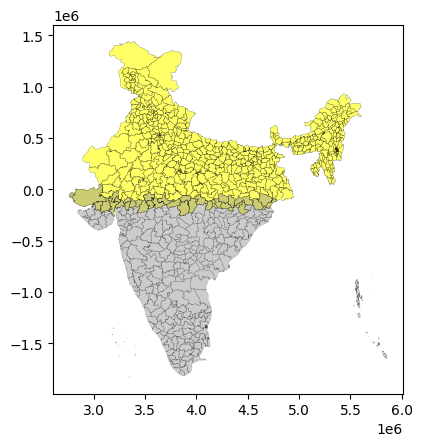

In [63]:
#plotting both halves
#north-south
base=MunisN_india.plot(facecolor='yellow', edgecolor='black',linewidth=0.2, alpha=0.6)
MunisS_india.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

<Axes: >

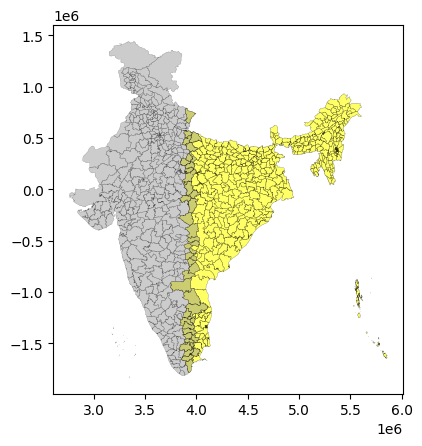

In [64]:
#west-east
base=MunisE_india.plot(facecolor='yellow', edgecolor='black',linewidth=0.2, alpha=0.6)
MunisW_india.plot(facecolor='grey', edgecolor='black',linewidth=0.2,ax=base, alpha=0.4)

**a. INTERSECTION**

<Axes: >

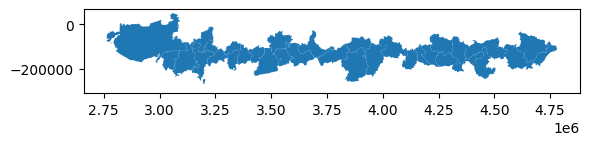

In [65]:
#keeping what's common to both of these maps (beige areas)
munisNS_india=MunisN_india.overlay(MunisS_india, how="intersection",keep_geom_type=True)
munisNS_india.plot()

<Axes: >

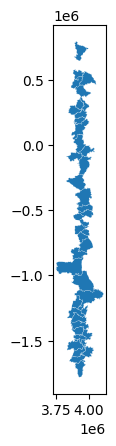

In [66]:
munisWE_india=MunisW_india.overlay(MunisE_india, how="intersection",keep_geom_type=True)
munisWE_india.plot(edgecolor='white',linewidth=0.1)

**b. SIMMETRIC DIFFERENCE**

<Axes: >

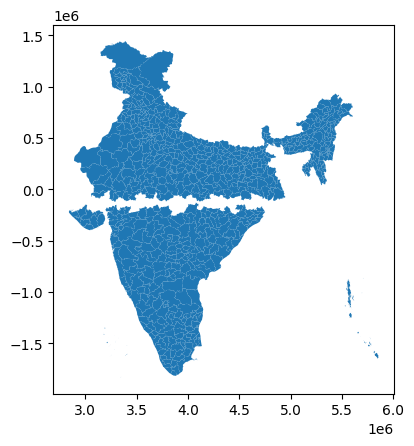

In [67]:
#we keep everything except what we got in the intersection
MunisN_india.overlay(MunisS_india, how="symmetric_difference",keep_geom_type=False).plot()

<Axes: >

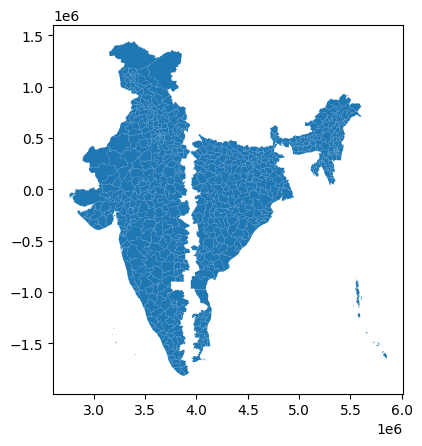

In [68]:
MunisW_india.overlay(MunisE_india, how="symmetric_difference",keep_geom_type=False).plot()

###**2. APPLYING TO THE OTHER MAPS**

In [69]:
# hulls for the mid size airports:
India_AirTopLeft_hull=India_AirTopLeft.dissolve().convex_hull
India_AirTopRight_hull=India_AirTopRight.dissolve().convex_hull
India_AirBottomLeft_hull=India_AirBottomLeft.dissolve().convex_hull
India_AirBottomRight_hull=India_AirBottomRight.dissolve().convex_hull

In [70]:
#creating what we're missing since we didn't use it before
large_airport=airports_24378[airports_24378.kind=='large_airport']
large_airport.unary_union
large_airport.unary_union.convex_hull
LargeAirport_hull= gpd.GeoDataFrame(index=[0],
                                    crs=large_airport.crs,
                                    geometry=[large_airport.unary_union.convex_hull])
LargeAirport_hull['name']='large airports hull'
# then
LargeAirport_hull

,geometry,name
0,"POLYGON ((3807754.324 -1772954.520, -5465004.6...",large airports hull


,geometry,shapeName_1_1,shapeISO_1_1,shapeID_1_1,shapeGroup_1_1,shapeType_1_1,shapeName_2_1,shapeISO_2_1,shapeID_2_1,shapeGroup_2_1,...,shapeName_1_2,shapeISO_1_2,shapeID_1_2,shapeGroup_1_2,shapeType_1_2,shapeName_2_2,shapeISO_2_2,shapeID_2_2,shapeGroup_2_2,shapeType_2_2
0,"MULTIPOLYGON (((3200537.207 -288784.338, 32005...",Hoshangabad,None,76128533B45314020251888,IND,ADM2,Hoshangabad,None,76128533B45314020251888,IND,...,Narsimhapur,None,76128533B20683890392439,IND,ADM2,Narsimhapur,None,76128533B20683890392439,IND,ADM2


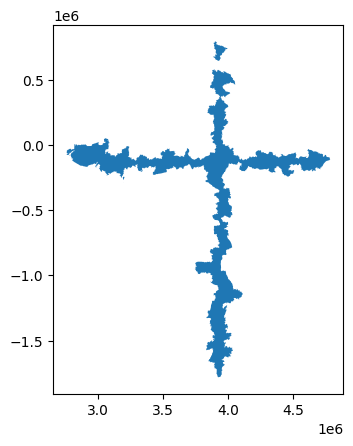

In [71]:
munisNS_india.dissolve().overlay(munisWE_india.dissolve(), how="union",keep_geom_type=True).dissolve().plot()
muniMidIndia=munisNS_india.dissolve().overlay(munisWE_india.dissolve(), how="union",keep_geom_type=True).dissolve()
muniMidIndia

In [72]:
# some cleaning
muniMidIndia['zone']='middles'
muniMidIndia=muniMidIndia.loc[:,['zone','geometry']]
muniMidIndia

,zone,geometry
0,middles,"MULTIPOLYGON (((3200537.207 -288784.338, 32005..."


<Axes: >

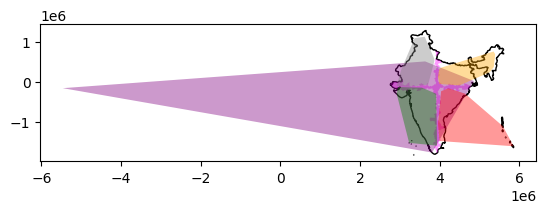

In [73]:
#now we have everything that was asked of us
base = india_24378.plot(color='white', edgecolor='black')
muniMidIndia.plot(ax=base,facecolor='magenta',alpha=0.4)
LargeAirport_hull.plot(ax=base,facecolor='purple',alpha=0.4)
India_AirTopLeft_hull.plot(ax=base,facecolor='grey', alpha=0.4)
India_AirTopRight_hull.plot(ax=base,facecolor='orange', alpha=0.4)
India_AirBottomLeft_hull.plot(ax=base,facecolor='green', alpha=0.4)
India_AirBottomRight_hull.plot(ax=base,facecolor='red', alpha=0.4)